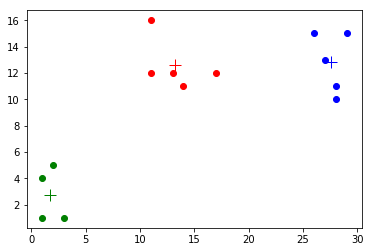

In [11]:
from numpy import *
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans


#dataSet:聚类数据集
#k:指定的k个类（大佬）
def kmeans(dataSet, k):
    #得到数据样本的维度n
    sampleNum, col = dataSet.shape
     #初始化为一个(k,n)的矩阵=簇
    cluster = mat(zeros((sampleNum, 2)))
    #生成全零阵
    centroids = zeros((k, col))
    #选择质心
    for i in range(k):
        #索引为随机生成的int类型的且在0-sampleNum间的数
        index = int(random.uniform(0, sampleNum))
        centroids[i, :] = dataSet[index, :]
    #设置flag，查看聚类结果是否发生变化
    clusterChanged = True
     #只要聚类结果一直发生变化，就一直执行聚类算法，直至所有数据点聚类结果不变化
    while clusterChanged:
        #聚类结果变化布尔类型置为false
        clusterChanged = False
         #遍历数据集每一个样本向量
        for i in range(sampleNum):
            #使用sqrt函数（二分法）
            minDist = sqrt(sum(power(centroids[0, :] - dataSet[i, :], 2)))
            minIndex = 0
            #计算点到质心的距离
            for j in range(1,k):
                distance = sqrt(sum(power(centroids[j, :] - dataSet[i, :], 2)))
                #当前最小距离一定时，索引为J
                if distance < minDist:
                    minDist  = distance
                    minIndex = j

            # 当前聚类结果中第i个样本的聚类结果发生变化：布尔类型置为true，继续聚类算法
            if cluster[i, 0] != minIndex:
                clusterChanged = True
                #更新聚类结果和平方误差
                cluster[i, :] = minIndex, minDist**2
        #遍历每一个质心
        for j in range(k):
            #筛选出属于当前质心类的所有样本
            pointsInCluster = dataSet[nonzero(cluster[:, 0].A == j)[0]]
            #计算列的均值（使用axis=0：求列的均值）
            centroids[j, :] = mean(pointsInCluster, axis = 0)

    return centroids, cluster

#创建简单数据集以及进行可视化
dataSet = [[1,1],[3,1],[1,4],[2,5],[11,12],[14,11],[13,12],[11,16],[17,12],[28,10],[26,15],[27,13],[28,11],[29,15]]
dataSet = mat(dataSet)
k = 3
centroids, cluster = kmeans(dataSet, k)
sampleNum, col = dataSet.shape
mark = ['or', 'ob', 'og']

for i in range(sampleNum):
    markIndex = int(cluster[i, 0])
    plt.plot(dataSet[i, 0], dataSet[i, 1], mark[markIndex])

mark = ['+r', '+b', '+g']
for i in range(k):
    plt.plot(centroids[i, 0], centroids[i, 1], mark[i], markersize=12)

plt.show()

In [1]:
import pandas as pd
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df_db_sfz = pd.read_table("../TFLearn/DB_SUM.txt")
df_db_hh = pd.read_table("../TFLearn/DB_HH_SUM.txt")

In [3]:
df_db_sfz['SUM_CB_JE'] = df_db_sfz['SUM_CB_JE'].fillna(0)
df_db_sfz['SUM_FC_MJ'] = df_db_sfz['SUM_FC_MJ'].fillna(0)
df_db_sfz['SUM_GJJDK_JE'] = df_db_sfz['SUM_GJJDK_JE'].fillna(0)
df_db_sfz['SUM_GJJJN_JE'] = df_db_sfz['SUM_GJJJN_JE'].fillna(0)
df_db_sfz['SUM_SW_JE'] = df_db_sfz['SUM_SW_JE'].fillna(0)
df_db_sfz['DB_HH'] = df_db_sfz['DB_HH'].fillna(0)

In [4]:
df_db_hh['SUM_CB_JE'] = df_db_hh['SUM_CB_JE'].fillna(0)
df_db_hh['SUM_FC_MJ'] = df_db_hh['SUM_FC_MJ'].fillna(0)
df_db_hh['SUM_GJJDK_JE'] = df_db_hh['SUM_GJJDK_JE'].fillna(0)
df_db_hh['SUM_GJJJN_JE'] = df_db_hh['SUM_GJJJN_JE'].fillna(0)
df_db_hh['SUM_SW_JE'] = df_db_hh['SUM_SW_JE'].fillna(0)

In [5]:
print(df_db_sfz.shape)
df_db_sfz = df_db_sfz[(df_db_sfz['SFZ'] != '330622196604048414')]
print(df_db_sfz.shape)

(7723, 16)
(7722, 16)


In [6]:
df_db_sfz_num = df_db_sfz.drop(['SFZ','DB_HH'],1)
df_db_hh_num  = df_db_hh.drop(['DB_HH'],1)

In [7]:
df_db_sfz_num.info()
df_db_hh_num.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7722 entries, 0 to 7722
Data columns (total 14 columns):
SUM_CB          7722 non-null int64
SUM_CL          7722 non-null int64
SUM_FC          7722 non-null int64
SUM_GJJDK       7722 non-null int64
SUM_GJJJN       7722 non-null int64
SUM_QY          7722 non-null int64
SUM_SW          7722 non-null int64
SUM_ALL         7722 non-null int64
SUM_CB_JE       7722 non-null float64
SUM_FC_MJ       7722 non-null float64
SUM_GJJDK_JE    7722 non-null float64
SUM_GJJJN_JE    7722 non-null float64
SUM_SW_JE       7722 non-null float64
DB_JE           7722 non-null float64
dtypes: float64(6), int64(8)
memory usage: 904.9 KB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5547 entries, 0 to 5546
Data columns (total 14 columns):
SUM_CB          5547 non-null int64
SUM_CL          5547 non-null int64
SUM_FC          5547 non-null int64
SUM_GJJDK       5547 non-null int64
SUM_GJJJN       5547 non-null int64
SUM_QY          5547 non-null int64
SU

In [8]:
np_db_sfz = np.array(df_db_sfz_num)
np_db_hh = np.array(df_db_hh_num)

# from sklearn.preprocessing import MinMaxScaler

# minMax = MinMaxScaler()
# np_db_sfz = minMax.fit_transform(np_db_sfz)
# np_db_hh = minMax.fit_transform(np_db_hh)

In [9]:
np_db_sfz.shape
df_db_sfz_num.head(5)

,SUM_CB,SUM_CL,SUM_FC,SUM_GJJDK,SUM_GJJJN,SUM_QY,SUM_SW,SUM_ALL,SUM_CB_JE,SUM_FC_MJ,SUM_GJJDK_JE,SUM_GJJJN_JE,SUM_SW_JE,DB_JE
0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,620.0
1,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,720.0
2,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,680.0
3,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,620.0
4,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,720.0


In [13]:
# np_db_sfz_sum = np.sum(np_db_sfz[:,8:,9:,10:,:11:,12],axis=1)
    
np_db_sfz_1 = np.array(df_db_sfz_num[['SUM_CB_JE','SUM_FC_MJ','SUM_GJJDK_JE','SUM_GJJJN_JE','SUM_SW_JE']])
np_db_sfz_1_sum = np.array(np.sum(np_db_sfz_1,axis=1))
np_db_sfz_2 = np.array(df_db_sfz_num['SUM_ALL']) 
np_db_sfz_3 = np.array(df_db_sfz_num['DB_JE']) 

np_db_sum_AJE_XS = np.vstack((np_db_sfz_1_sum,np_db_sfz_2)).T
np_db_sum_AJE_DBJE = np.vstack((np_db_sfz_1_sum,np_db_sfz_3)).T
np_db_sum_XS_DBJE = np.vstack((np_db_sfz_2,np_db_sfz_3)).T


np_db_sum_ALL =  np.vstack((np_db_sfz_1_sum,np_db_sfz_2,np_db_sfz_3)).T


df_db_sum_ALL = pd.DataFrame(np_db_sum_ALL)

# 添加列名
df_db_sum_ALL.columns = ['AJE','XS', 'DBJE']

[[  0. 620.]
 [  0. 720.]
 [  0. 680.]
 ...
 [  0. 270.]
 [  0. 535.]
 [  0. 566.]]
[0 0 0 ... 0 0 0]
<class 'numpy.ndarray'>
(5, 2)
[[3.65653742e+00 1.28201459e-01]
 [8.95453877e+02 1.20762712e+00]
 [1.44505000e+03 2.29032258e+00]
 [5.91558026e+02 1.16228070e+00]
 [2.92894000e+03 2.50000000e+00]]
<class 'numpy.ndarray'>


<Figure size 432x288 with 0 Axes>

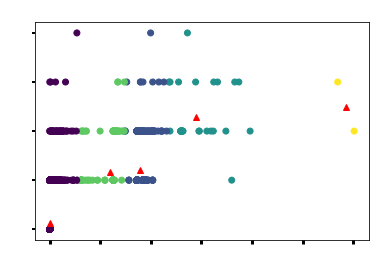

In [320]:
import numpy as np
import matplotlib.pyplot as plt
 
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs
 
plt.figure()


print(data)
# n_samples = 1500
# random_state = 170
# X, y = make_blobs(n_samples=n_samples, random_state=random_state)
X = np_db_sum_AJE_XS
# correct number of clusters
estimator= KMeans(n_clusters=5)
y_pred =estimator.fit_predict(X)

xy=estimator.cluster_centers_

np.set_printoptions(threshold=20)

np.savetxt("y_pred.txt", y_pred, fmt="%d", delimiter=",")
np.savetxt("xy.txt", xy, fmt="%d", delimiter=",")


fig, ax = plt.subplots()
plt.scatter(X[:, 0], X[:, 1], c=y_pred)
plt.plot(xy[:,0],xy[:,1],'r^')
plt.title("DB",color='white')
plt.xlabel('X ',color='white')
plt.ylabel('Y ',color='white')
ax.tick_params(axis='x',labelcolor='white', labelsize='medium', width=3)
ax.tick_params(axis='y',labelcolor='white', labelsize='medium', width=2)
ymajorLocator = MultipleLocator(1)
ax.yaxis.set_major_locator(ymajorLocator)

[[  0. 620.]
 [  0. 720.]
 [  0. 680.]
 ...
 [  0. 270.]
 [  0. 535.]
 [  0. 566.]]
[0 0 0 ... 2 3 3]
<class 'numpy.ndarray'>
(5, 2)
[[  4.30060156 677.26132245]
 [946.40421277 295.67787234]
 [  6.6416704  240.04487668]
 [  5.57256563 502.81517088]
 [801.06551064 657.16725532]]
<class 'numpy.ndarray'>


<Figure size 432x288 with 0 Axes>

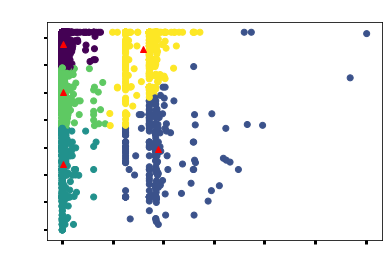

In [331]:
import numpy as np
import matplotlib.pyplot as plt
 
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs
 
plt.figure()


print(data)
# n_samples = 1500
# random_state = 170
# X, y = make_blobs(n_samples=n_samples, random_state=random_state)
X = np_db_sum_AJE_DBJE
# correct number of clusters
estimator= KMeans(n_clusters=5)
y_pred =estimator.fit_predict(X)

xy=estimator.cluster_centers_

np.set_printoptions(threshold=20)

np.savetxt("y_pred.txt", y_pred, fmt="%d", delimiter=",")
np.savetxt("xy.txt", xy, fmt="%d", delimiter=",")


fig, ax = plt.subplots()
plt.scatter(X[:, 0], X[:, 1], c=y_pred)
plt.plot(xy[:,0],xy[:,1],'r^')
plt.title("DB",color='white')
plt.xlabel('X ',color='white')
plt.ylabel('Y ',color='white')
ax.tick_params(axis='x',labelcolor='white', labelsize='medium', width=3)
ax.tick_params(axis='y',labelcolor='white', labelsize='medium', width=2)

[[  0. 620.]
 [  0. 720.]
 [  0. 680.]
 ...
 [  0. 270.]
 [  0. 535.]
 [  0. 566.]]
[4 0 0 ... 1 2 2]
<class 'numpy.ndarray'>
(5, 2)
[[2.45794009e-01 7.14163685e+02]
 [3.08959835e-01 3.61681782e+02]
 [2.00124688e-01 5.19989988e+02]
 [3.43228200e-01 1.62591818e+02]
 [1.85168125e-01 6.33432022e+02]]
<class 'numpy.ndarray'>


<Figure size 432x288 with 0 Axes>

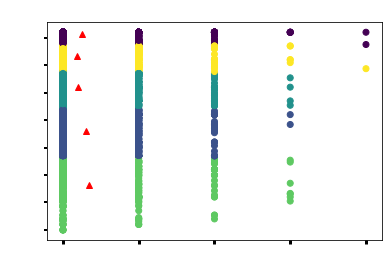

In [332]:
import numpy as np
import matplotlib.pyplot as plt
 
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs
 
plt.figure()


print(data)
# n_samples = 1500
# random_state = 170
# X, y = make_blobs(n_samples=n_samples, random_state=random_state)
X = np_db_sum_XS_DBJE
# correct number of clusters
estimator= KMeans(n_clusters=5)
y_pred =estimator.fit_predict(X)

xy=estimator.cluster_centers_

np.set_printoptions(threshold=20)

np.savetxt("y_pred.txt", y_pred, fmt="%d", delimiter=",")
np.savetxt("xy.txt", xy, fmt="%d", delimiter=",")


fig, ax = plt.subplots()
plt.scatter(X[:, 0], X[:, 1], c=y_pred)
plt.plot(xy[:,0],xy[:,1],'r^')
plt.title("DB",color='white')
plt.xlabel('X ',color='white')
plt.ylabel('Y ',color='white')
ax.tick_params(axis='x',labelcolor='white', labelsize='medium', width=3)
ax.tick_params(axis='y',labelcolor='white', labelsize='medium', width=2)


xmajorLocator = MultipleLocator(1)
ax.xaxis.set_major_locator(xmajorLocator)

/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1706: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


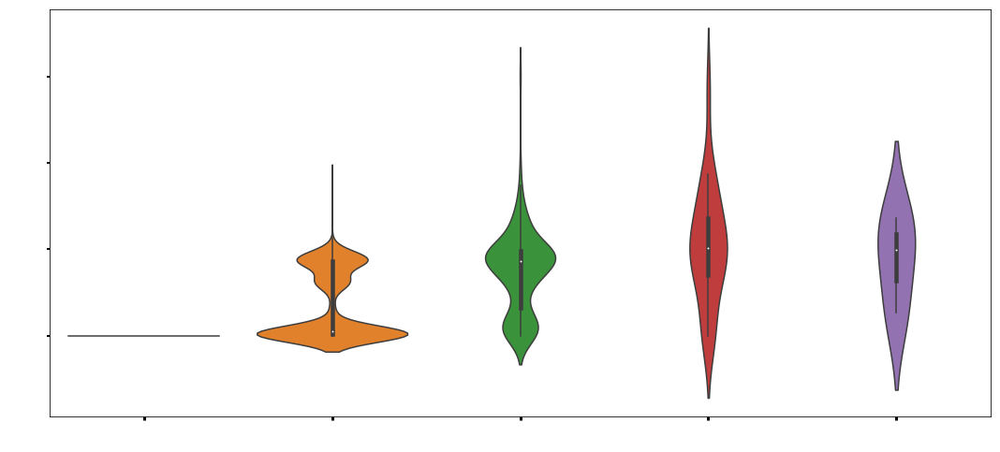

In [48]:
_, axes = plt.subplots(1, sharey=True, figsize=(18, 8))
plt.xlabel('X',color='white')
plt.ylabel('Y',color='white')
sns.violinplot(x='XS',y='AJE',data=df_db_sum_ALL, ax=axes)
axes.tick_params(axis='x',labelcolor='white', labelsize='medium', width=3)
axes.tick_params(axis='y',labelcolor='white', labelsize='medium', width=2)

/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1706: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


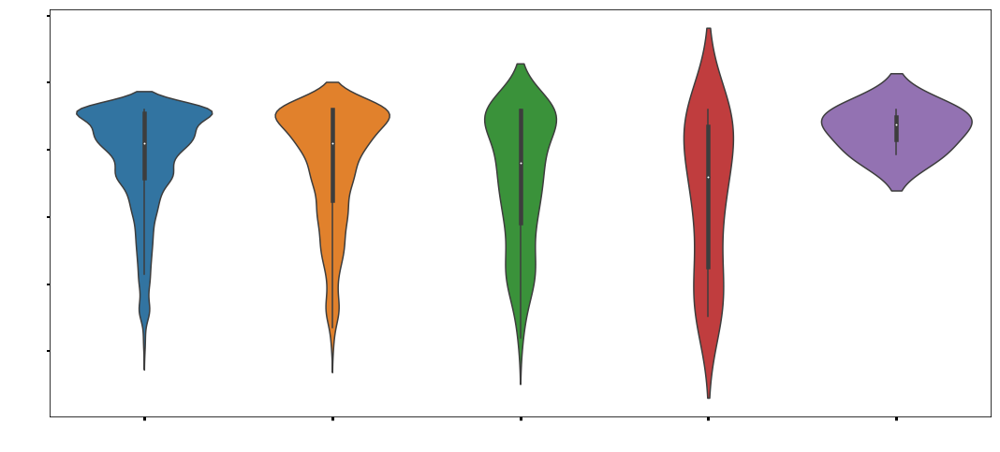

In [49]:
_, axes = plt.subplots(1, sharey=True, figsize=(18, 8))
plt.xlabel('X',color='white')
plt.ylabel('Y',color='white')
sns.violinplot(x='XS',y='DBJE',data=df_db_sum_ALL, ax=axes)
axes.tick_params(axis='x',labelcolor='white', labelsize='medium', width=3)
axes.tick_params(axis='y',labelcolor='white', labelsize='medium', width=2)

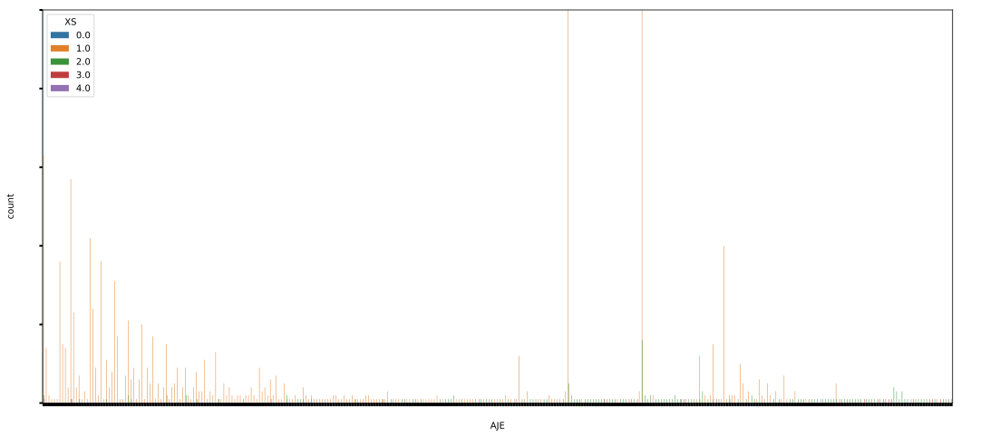

In [106]:
# plt.figure(figsize=(20, 6))  # 修改图形尺寸
_, axes = plt.subplots(1,  figsize=(18, 8))

plt.axis([0, 3500, 0, 100])
x = sns.countplot(x='AJE', hue='XS', data=df_db_sum_ALL)
axes.tick_params(axis='x',labelcolor='white', labelsize='medium', width=3)
axes.tick_params(axis='y',labelcolor='white', labelsize='medium', width=2)
plt.show()

In [ ]:
sns.jointplot(x='age', y='jl',
              data=df, kind='scatter');

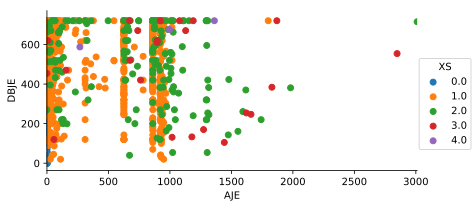

In [103]:
facet = sns.FacetGrid(df_db_sum_ALL, hue="XS",aspect=2)
# facet.map(sns.kdeplot,'AJE','DBJE',shade= True)
facet.map(plt.scatter,'AJE','DBJE')
facet.set(xlim=(0, df_db_sum_ALL['AJE'].max()))
facet.add_legend()

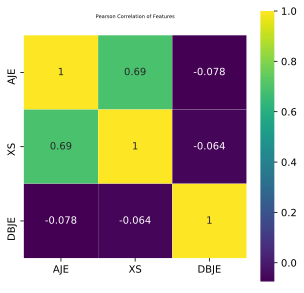

In [97]:
colormap = plt.cm.viridis
plt.figure(figsize=(5,5))
plt.title('Pearson Correlation of Features', y=1.05, size=5)
sns.heatmap(df_db_sum_ALL.astype(float).corr(),linewidths=0.1,vmax=1.0, square=True, cmap=colormap, linecolor='white', annot=True, xticklabels=True, yticklabels=True)

In [93]:
def splom_viz(df, labels=None):
    ax = sns.pairplot(df, hue=labels, diag_kind='kde', size=2)
    plt.show()
    

splom_viz(df_db_sum_ALL)

/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1706: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


In [90]:
# from pandas.tools.plotting import radviz

# def rad_viz(df,labels):
#     fig = radviz(df, labels, color=sns.color_palette())
#     plt.show()

# rad_viz(df_db_sum_ALL.ix[:,0:],'XS')

In [69]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.ticker import MultipleLocator, FormatStrFormatter
%config InlineBackend.figure_format = 'svg'
fig = plt.figure(figsize=(8, 6))
axes = fig.add_subplot(111, projection='3d')

# fig = plt.subplots(1, figsize=(18, 8))

data = df_db_sum_ALL
x,y,z= data['AJE'],data['XS'],data['DBJE']

# 创建三维对象
# fig= plt.figure(figsize=(18, 8))
# ax = Axes3D(fig)
# axes = Axes3D(fig)
print(fig.get_size_inches())
# 绘制散点图
axes.scatter(x[:],y[:],z[:],c='b')
axes.scatter(x[:],y[:],z[:],c='r')
axes.scatter(x[:],y[:],z[:],c='g')

ymajorLocator = MultipleLocator(1)
axes.yaxis.set_major_locator(ymajorLocator)

# 显示图像
plt.show()

[8. 6.]


In [84]:
# from sklearn.cluster import KMeans
# k = 2
# data = np_db_sum_2  #生成一个随机数据，样本大小为100, 特征数为3

# print(type(data))
# #假如我要构造一个聚类数为k的聚类器
# estimator = KMeans(
#     n_clusters=k,
#     init='k-means++',
#     n_init=10,
#     max_iter=300,
#     tol=0.0001,
#     precompute_distances='auto',
#     verbose=0,
#     random_state=None,
#     copy_x=True,
#     n_jobs=1,
#     algorithm='auto')  #构造聚类器
# estimator.fit(data)  #聚类
# label_pred = estimator.labels_  #获取聚类标签
# centroids = estimator.cluster_centers_  #获取聚类中心
# inertia = estimator.inertia_  # 获取聚类准则的总和


# y_pred = estimator.fit_predict(data)  # 直接对数据进行聚类，聚类不需要进行预测


# plt.scatter(data[:, 0], data[:, 1], c=y_pred)
# plt.plot(centroids[:,0],centroids[:,1],'r^')
# plt.title("Correct Number of Blobs")
# 可以输出 y_pred 作为标签
# 再移除低保金额试试

In [70]:
# DBSCAN
# import numpy as np

# from sklearn.cluster import DBSCAN
# from sklearn import metrics
# from sklearn.datasets.samples_generator import make_blobs
# from sklearn.preprocessing import StandardScaler


# # #############################################################################
# # Generate sample data
# centers = [[1, 1], [-1, -1], [1, -1]]
# # X, labels_true = make_blobs(n_samples=750, centers=centers, cluster_std=0.4,
# #                             random_state=0)

# X = np_db_sum_2
# print(labels_true)
# X = StandardScaler().fit_transform(X)

# # #############################################################################
# # Compute DBSCAN
# db = DBSCAN(eps=0.3, min_samples=10).fit(X)
# core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
# core_samples_mask[db.core_sample_indices_] = True
# labels = db.labels_

# # Number of clusters in labels, ignoring noise if present.
# n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)

# # print('Estimated number of clusters: %d' % n_clusters_)
# # print("Homogeneity: %0.3f" % metrics.homogeneity_score(labels_true, labels))
# # print("Completeness: %0.3f" % metrics.completeness_score(labels_true, labels))
# # print("V-measure: %0.3f" % metrics.v_measure_score(labels_true, labels))
# # print("Adjusted Rand Index: %0.3f"
# #       % metrics.adjusted_rand_score(labels_true, labels))
# # print("Adjusted Mutual Information: %0.3f"
# #       % metrics.adjusted_mutual_info_score(labels_true, labels))
# # print("Silhouette Coefficient: %0.3f"
# #       % metrics.silhouette_score(X, labels))

# # #############################################################################
# # Plot result
# import matplotlib.pyplot as plt

# # Black removed and is used for noise instead.
# unique_labels = set(labels)
# colors = [plt.cm.Spectral(each)
#           for each in np.linspace(0, 1, len(unique_labels))]
# for k, col in zip(unique_labels, colors):
#     if k == -1:
#         # Black used for noise.
#         col = [0, 0, 0, 1]

#     class_member_mask = (labels == k)

#     xy = X[class_member_mask & core_samples_mask]
#     plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
#              markeredgecolor='k', markersize=14)

#     xy = X[class_member_mask & ~core_samples_mask]
#     plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
#              markeredgecolor='k', markersize=6)

# plt.title('Estimated number of clusters: %d' % n_clusters_)
# plt.show()

In [71]:
# import numpy as np
# import matplotlib.pyplot as plt

# from sklearn.cluster import KMeans
# from sklearn.datasets import make_blobs
# from matplotlib.ticker import MultipleLocator, FormatStrFormatter

# plt.figure(figsize=(12, 12))


# # plt.scatter(np_db_sum_2[:, 0], np_db_sum_2[:, 1], c=y_pred)
# # plt.title("DB",color='white')
# # plt.xlabel('X ',color='white')
# # plt.ylabel('Y ',color='white')


# # n_samples = 1500
# # random_state = 170
# # X, y = make_blobs(n_samples=n_samples, random_state=random_state)
# print('np_db_sum_2',np_db_sum_2)
# X = np_db_sum_2
# # Incorrect number of clusters
# y_pred = KMeans(n_clusters=2, random_state=random_state).fit_predict(X)


# ax1 = plt.subplot(221)
# plt.scatter(X[:, 0], X[:, 1], c=y_pred)
# plt.title("Incorrect Number of Blobs")
# ax1.tick_params(axis='x',labelcolor='white', labelsize='medium', width=3)
# ax1.tick_params(axis='y',labelcolor='white', labelsize='medium', width=2)
# ymajorLocator = MultipleLocator(1) # 设置刻度为1的倍数
# ax1.yaxis.set_major_locator(ymajorLocator)

# # Anisotropicly distributed data
# transformation = [[1, 1], [0, 0]]
# X_aniso = np.dot(X, transformation)
# y_pred = KMeans(n_clusters=3, random_state=random_state).fit_predict(X_aniso)

# ax2 = plt.subplot(222)
# plt.scatter(X_aniso[:, 0], X_aniso[:, 1], c=y_pred)
# plt.title("Anisotropicly Distributed Blobs")
# ax2.tick_params(axis='x',labelcolor='white', labelsize='medium', width=3)
# ax2.tick_params(axis='y',labelcolor='white', labelsize='medium', width=2)

# # Different variance
# X_varied  =  np_db_sum_2
# y_pred = KMeans(n_clusters=3, random_state=random_state).fit_predict(X_varied)

# ax3 = plt.subplot(223)
# plt.scatter(X_varied[:, 0], X_varied[:, 1], c=y_pred)
# plt.title("Unequal Variance")
# ax3.tick_params(axis='x',labelcolor='white', labelsize='medium', width=3)
# ax3.tick_params(axis='y',labelcolor='white', labelsize='medium', width=2)
# ax3.yaxis.set_major_locator(ymajorLocator)
# print(type(X_varied))
# print(X_varied)
# np.savetxt("X_varied.txt", X_varied, fmt="%d", delimiter=",")
# # # Unevenly sized blobs
# # X_filtered = np.vstack((X[y == 0][:500], X[y == 1][:100], X[y == 2][:10]))
# # y_pred = KMeans(n_clusters=3,
# #                 random_state=random_state).fit_predict(X_filtered)

# # plt.subplot(224)
# # plt.scatter(X_filtered[:, 0], X_filtered[:, 1], c=y_pred)
# # plt.title("Unevenly Sized Blobs")

# plt.show()

In [85]:
# # 全数据集可视化
# # 降维
# # t-SNE
# from sklearn.manifold import TSNE
# from sklearn.preprocessing import StandardScaler

# X = df_db_sum_ALL
# # X['International plan'] = X['International plan'].map({'Yes': 1, 'No': 0})
# # X['Voice mail plan'] = X['Voice mail plan'].map({'Yes': 1, 'No': 0})

# scaler = StandardScaler()
# X_scaled = scaler.fit_transform(X)